In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/skin-cancer-datasetv3/README.dataset.txt
/kaggle/input/skin-cancer-datasetv3/README.roboflow.txt
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0029387_jpg.rf.c790337dff5b55777a7ceedb7ab82d21.jpg
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0029842_jpg.rf.0b11155f89407f7c49521a795bfab6b1.jpg
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0029273_jpg.rf.e1a7e845b0152533c6a794fe9b1feaba.jpg
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0034122_jpg.rf.a11aba7c75a49ffc1813fe0ab7376eb5.jpg
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0033031_jpg.rf.d2d74399d92b1b2bcecd237d76f3dce7.jpg
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0026548_jpg.rf.44611a49337de8144eceeeae2d58b186.jpg
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0032932_jpg.rf.9b349b5a3012eca59c2b3eb7fb24992c.jpg
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0029646_jpg.rf.9ae62ae010959e6206f2ab98590f6a4b.jpg
/kaggle/input/skin-cancer-datasetv3/valid/ISIC_0027131_jpg.rf.463833b18582a3472ce5c6a5c3e5e049.jp

In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

base_path = "/kaggle/input/skin-cancer-datasetv3/"

In [3]:
print("Base path contents:", os.listdir(base_path))

Base path contents: ['README.dataset.txt', 'README.roboflow.txt', 'valid', 'test', 'train']


In [4]:
train_path = os.path.join(base_path, "train")
print("Train folder contents:", os.listdir(train_path))

Train folder contents: ['ISIC_0034021_jpg.rf.50138880cbaf5cbdf2ec2e144bf8dd94.jpg', 'ISIC_0027140_jpg.rf.aebe30098d2eb2698f896d83e25bba97.jpg', 'ISIC_0033442_jpg.rf.79ee278eabbe09939f2db487c8cefd02.jpg', 'ISIC_0027003_jpg.rf.51a337902b8c9f5430fef09ae6bc835b.jpg', 'ISIC_0029414_jpg.rf.75a531b00f4dd3f4d036368e1b033748.jpg', 'ISIC_0026125_jpg.rf.219ab78d18861b21ca57655f4893fbb1.jpg', 'ISIC_0027807_jpg.rf.df0ab14b3471855f971f6f9bf9fcb8ba.jpg', 'ISIC_0031279_jpg.rf.c4790e358441ccd5dfaa13305e50a39a.jpg', 'ISIC_0025786_jpg.rf.bb7c3624f8cea29d1428872ae38cc10b.jpg', 'ISIC_0030380_jpg.rf.d8cebbbd1263090b4d800c78c07320f4.jpg', 'ISIC_0027890_jpg.rf.894c3151f676da327f66c4460131b98c.jpg', 'ISIC_0027601_jpg.rf.e74c6e0632cad57d4a176b75520bc320.jpg', 'ISIC_0034270_jpg.rf.7911b3561b63ab3028da1031ea3c5f59.jpg', 'ISIC_0027332_jpg.rf.cc0f47a94bd4aa45a21e1d9697a9d346.jpg', 'ISIC_0033567_jpg.rf.7b31d505d71a23dbecc4c302822b6805.jpg', 'ISIC_0027394_jpg.rf.eb0d6a134cb1c7174a787cb2899e4dc5.jpg', 'ISIC_0033686_jp

## 🖼️ 1. Sample Image Selection

- Loaded **three random images** from the training dataset at:  
  `/kaggle/input/skin-cancer-datasetv3/train`
- Displayed the images using **Matplotlib** to inspect the sample content.

---

### ⚙️ 2. Intensity Transformation Techniques

Applied the following **four transformations** on each image:

| Transformation                  | Description                                                                 |
|---------------------------------|-----------------------------------------------------------------------------|
| **Log Transformation**           | Expands darker pixels and compresses bright areas using logarithmic scaling. |
| **Gamma Correction (Power-law)** | Adjusts image brightness using γ = 1.5. Values >1 darken the image.         |
| **Contrast Stretching**          | Linearly maps pixel values to the full range (0–255) to enhance contrast.  |
| **Histogram Equalization (CLAHE)** | Improves local contrast using the LAB color model and adaptive histogram equalization. |

- Each transformed image was displayed **side-by-side with the original** for easy comparison.

---

### 🔍 3. Filtering Techniques

Applied **three spatial filters** and **one edge-based filter** to smooth or enhance image details:

| Filter Type        | Method                  | Effect                                                      |
|-------------------|------------------------|------------------------------------------------------------|
| **Mean Filter**    | `cv2.blur()`           | Reduces noise by averaging neighboring pixels.             |
| **Gaussian Blur**  | `cv2.GaussianBlur()`   | Smoothens image with weighted average, preserving edges.   |
| **Median Filter**  | `cv2.medianBlur()`     | Removes salt-and-pepper noise effectively.                 |
| **Sobel Edge Filter** | `cv2.Sobel()`        | Enhances edges using the gradient magnitude of intensity changes. |

---

### 📊 4. Result Visualization

- Each transformation and filter was applied and displayed **side-by-side**:
  - **Left:** Original image  
  - **Right:** Transformed or filtered result  

- This visualization allows a clear comparison of the **impact on brightness, contrast, and detail sharpness** for each method.


In [5]:
import os
import cv2
import random
import matplotlib.pyplot as plt

train_path = "/kaggle/input/skin-cancer-datasetv3/train"

In [6]:
image_files = [f for f in os.listdir(train_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

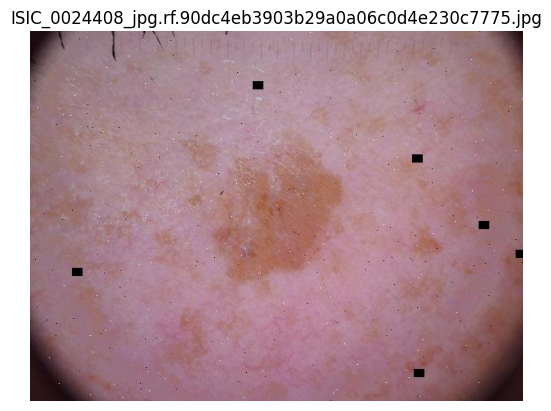

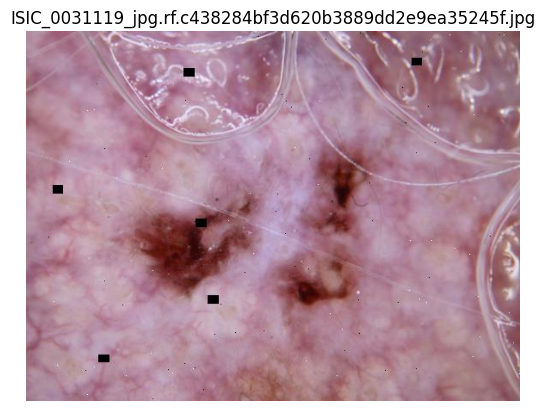

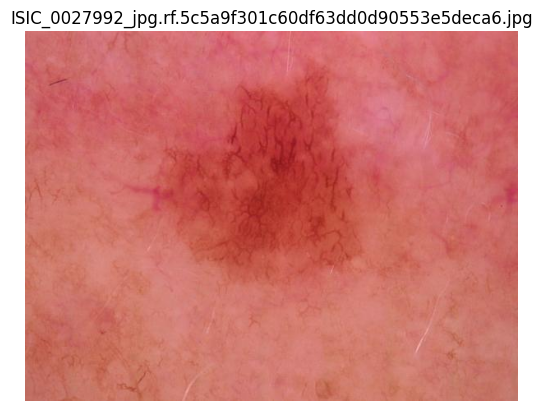

In [7]:
# Pick 3 random images
sample_files = random.sample(image_files, 3)

images = [cv2.imread(os.path.join(train_path, img)) for img in sample_files]
images = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in images if img is not None]

# Display images
for i, img in enumerate(images):
    plt.imshow(img)
    plt.title(sample_files[i])
    plt.axis('off')
    plt.show()

In [8]:
# Log Transformation
def log_transform(img):
    c = 255 / np.log(1 + np.max(img))
    log_img = c * np.log(1 + img.astype(np.float32))
    return np.uint8(log_img)

In [9]:
# Gamma Correction
def gamma_correction(img, gamma=1.5):
    img_float = img / 255.0
    gamma_img = np.power(img_float, gamma) * 255
    return np.uint8(gamma_img)

In [10]:
# Contrast Stretching
def contrast_stretch(img):
    in_min = np.min(img)
    in_max = np.max(img)
    out_img = (img - in_min) * (255 / (in_max - in_min))
    return np.uint8(out_img)

In [11]:
# CLAHE (Histogram Equalization)
def clahe_rgb(img):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    merged = cv2.merge([cl, a, b])
    return cv2.cvtColor(merged, cv2.COLOR_LAB2RGB)

--- Image: ISIC_0034021_jpg.rf.50138880cbaf5cbdf2ec2e144bf8dd94.jpg ---


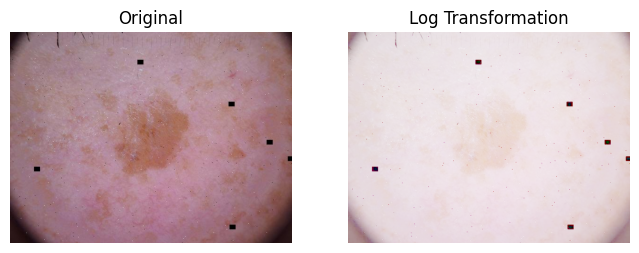

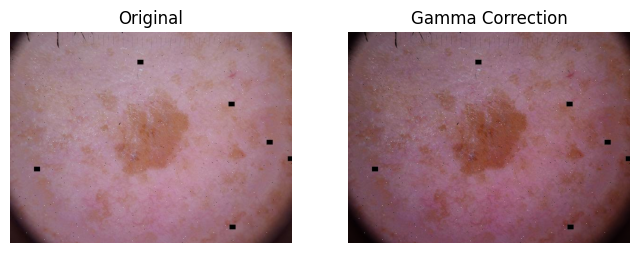

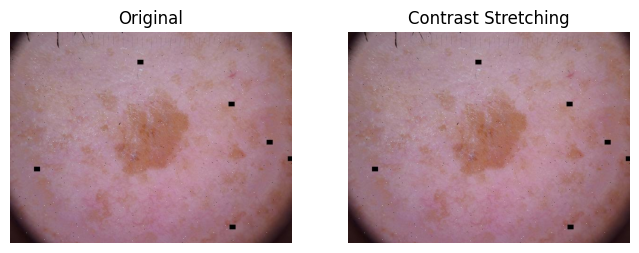

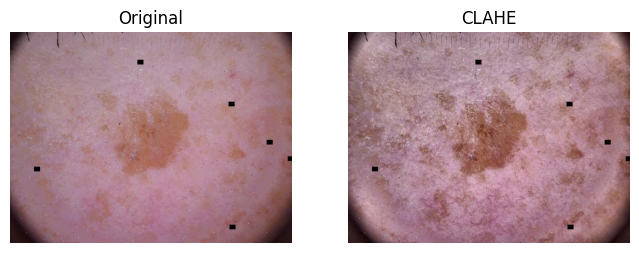

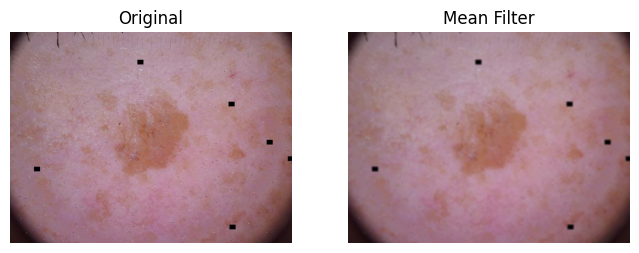

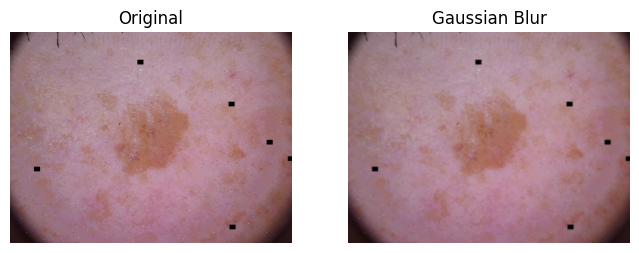

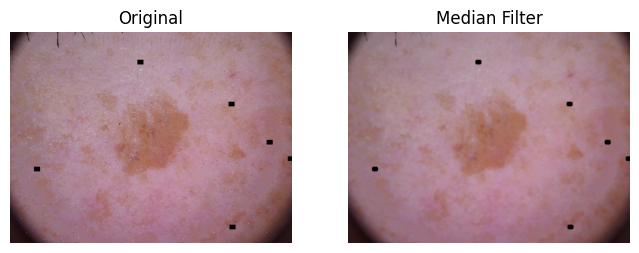

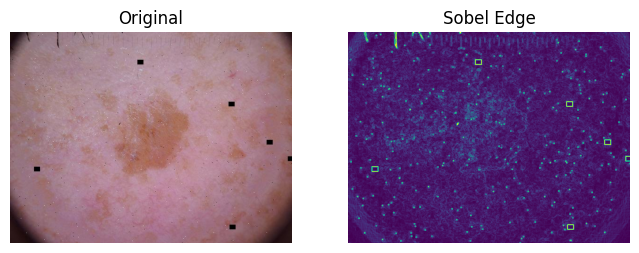

--- Image: ISIC_0027140_jpg.rf.aebe30098d2eb2698f896d83e25bba97.jpg ---


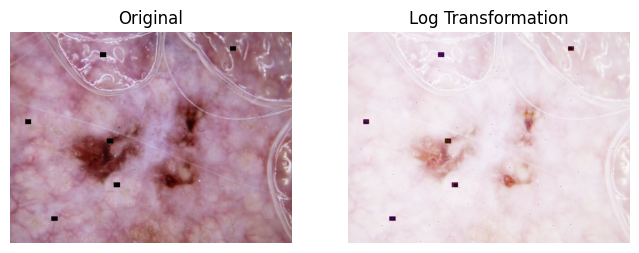

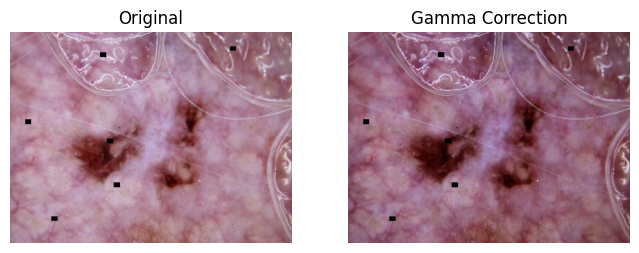

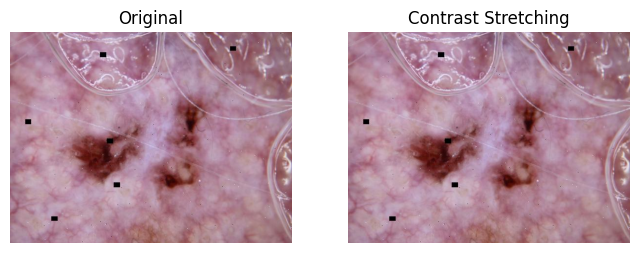

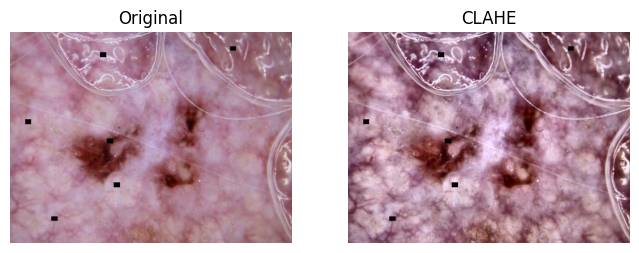

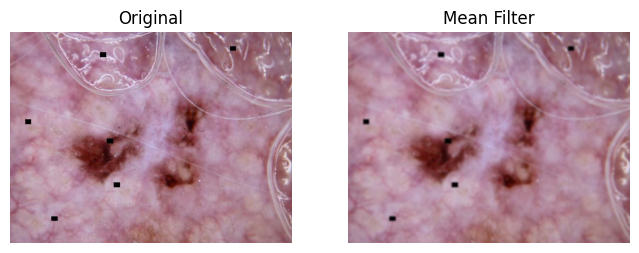

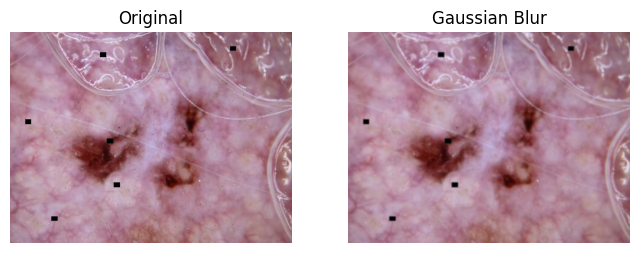

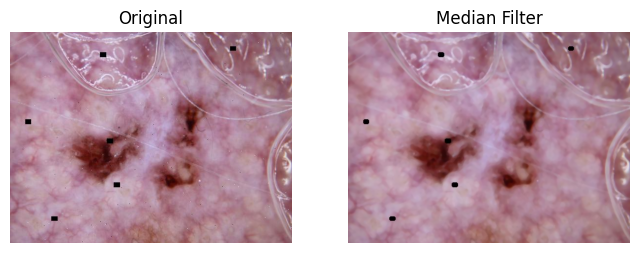

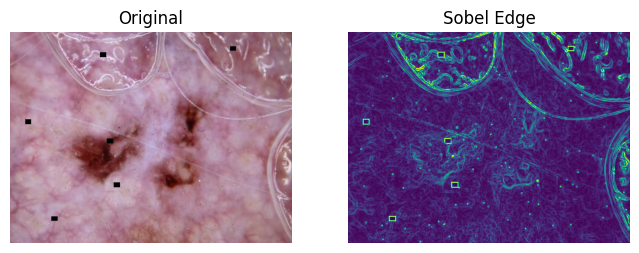

--- Image: ISIC_0033442_jpg.rf.79ee278eabbe09939f2db487c8cefd02.jpg ---


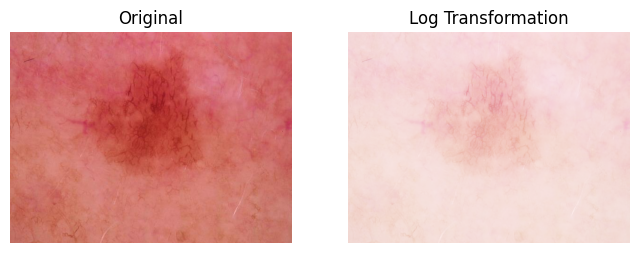

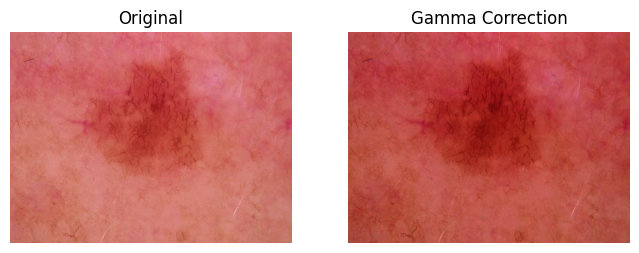

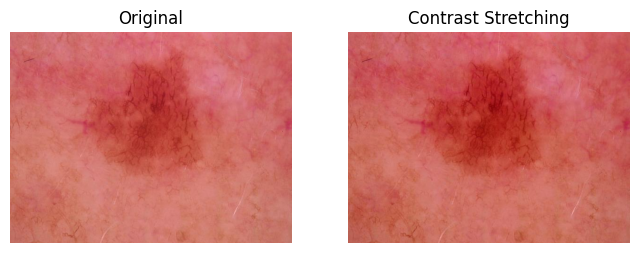

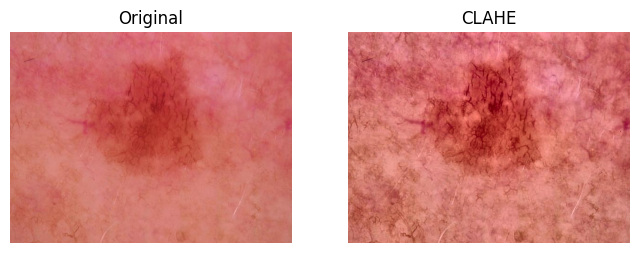

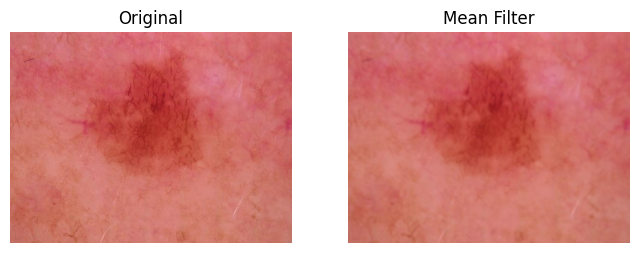

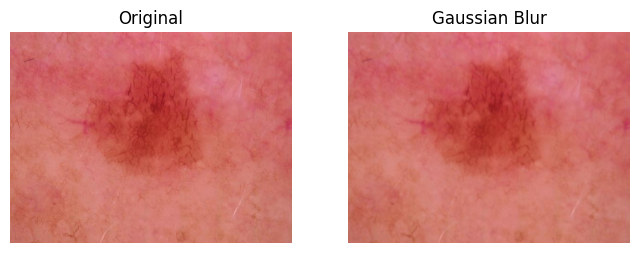

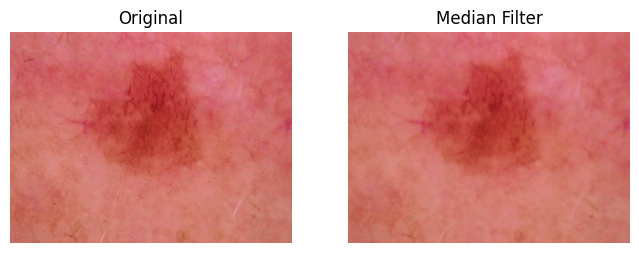

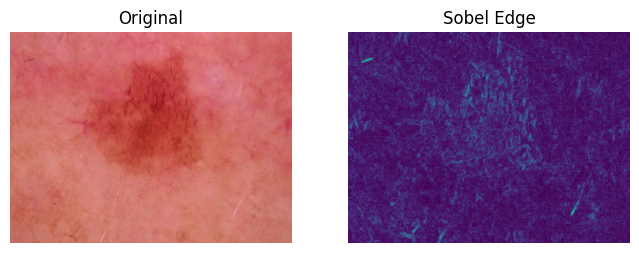

In [12]:
# --- 3. Define Filtering Operations ---
def apply_filters(img):
    filters = {}
    filters['Mean Filter'] = cv2.blur(img, (5,5))
    filters['Gaussian Blur'] = cv2.GaussianBlur(img, (5,5), 0)
    filters['Median Filter'] = cv2.medianBlur(img, 5)
    # Sobel Edge Enhancement
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    sobel_combined = cv2.magnitude(sobelx, sobely)
    filters['Sobel Edge'] = np.uint8(np.clip(sobel_combined, 0, 255))
    return filters

# --- 4. Helper function to display before-and-after ---
def show_results(original, transformed, title):
    plt.figure(figsize=(8,5))
    plt.subplot(1,2,1)
    plt.imshow(original)
    plt.title("Original")
    plt.axis('off')
    
    plt.subplot(1,2,2)
    plt.imshow(transformed)
    plt.title(title)
    plt.axis('off')
    plt.show()

# --- 5. Apply transformations and display results ---
for i, img in enumerate(images):
    print(f"--- Image: {image_files[i]} ---")
    
    # Intensity Transformations
    log_img = log_transform(img)
    gamma_img = gamma_correction(img, gamma=1.5)
    contrast_img = contrast_stretch(img)
    clahe_img = clahe_rgb(img)
    
    show_results(img, log_img, "Log Transformation")
    show_results(img, gamma_img, "Gamma Correction")
    show_results(img, contrast_img, "Contrast Stretching")
    show_results(img, clahe_img, "CLAHE")
    
    # Filtering
    filters = apply_filters(img)
    for f_name, f_img in filters.items():
        show_results(img, f_img, f_name)



## 🧩 COCO → YOLO Segmentation Conversion

This section converts the **COCO-format segmentation dataset** into the **YOLO segmentation format**, preparing it for YOLOv8 or YOLOv11 segmentation model training using the **Ultralytics** framework.

---

#### ⚙️ Step 1: Library Installation
The following Python packages are installed:
- **`pycocotools`** → to handle COCO JSON annotations  
- **`tqdm`** → for progress visualization  
- **`ultralytics`** → YOLO training and evaluation tools  

---

#### 🧠 Step 2: Conversion Process
A custom function performs the following operations:
1. **Loads COCO annotations** (`_annotations.coco.json`) for each dataset split (`train`, `valid`, `test`).  
2. **Creates YOLO-style folders** — `images/` and `labels/`.  
3. **Converts segmentation polygons** into **YOLO-normalized coordinates** (values between 0 and 1).  
4. **Generates YOLO label files** (`.txt`) in the format:
5. **Copies images** into the respective YOLO `images/` directory.  
6. **Processes all splits automatically** to ensure consistency.  

---

#### 🔁 Step 3: Split Processing
All three dataset splits — **train**, **valid**, and **test** — are converted sequentially.  
The final YOLO-formatted dataset is saved inside:
/kaggle/working/dataset/
│
├── train/
│ ├── images/
│ └── labels/
│
├── valid/
│ ├── images/
│ └── labels/
│
└── test/
├── images/
└── labels/

---

Each `.txt` file corresponds to its image and contains polygon coordinates describing the segmentation mask in YOLO format.  
All coordinates are **normalized** relative to image width and height.


In [13]:
!pip install pycocotools tqdm
!pip install ultralytics pycocotools tqdm --quiet

import os, json, shutil
from tqdm import tqdm

def coco_to_yolo_segmentation(coco_json, output_dir):
    with open(coco_json, 'r') as f:
        data = json.load(f)

    # Prepare mapping
    id_to_filename = {img['id']: img['file_name'] for img in data['images']}
    os.makedirs(os.path.join(output_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(output_dir, 'labels'), exist_ok=True)

    # Copy images and make YOLO labels
    for ann in tqdm(data['annotations'], desc=f"Converting {coco_json}"):
        image_id = ann['image_id']
        category_id = ann['category_id'] - 1  # YOLO expects 0-based class IDs
        segmentation = ann['segmentation'][0]

        # Normalize segmentation points
        image_info = next((img for img in data['images'] if img['id'] == image_id), None)
        w, h = image_info['width'], image_info['height']
        seg_norm = [f"{x/w:.6f} {y/h:.6f}" for x, y in zip(segmentation[::2], segmentation[1::2])]

        # Write label file
        label_path = os.path.join(output_dir, 'labels', id_to_filename[image_id].replace('.jpg', '.txt'))
        with open(label_path, 'w') as f:
            f.write(f"{category_id} " + " ".join(seg_norm) + "\n")

        # Move image to images/ folder
        src_img = os.path.join(os.path.dirname(coco_json), id_to_filename[image_id])
        dst_img = os.path.join(output_dir, 'images', id_to_filename[image_id])
        if os.path.exists(src_img):
            shutil.copy(src_img, dst_img)

# === Convert all splits ===
base = "/kaggle/input/skin-cancer-datasetv3"
for split in ['train', 'valid', 'test']:
    coco_file = os.path.join(base, split, "_annotations.coco.json")
    out_dir = os.path.join("/kaggle/working/dataset", split)
    coco_to_yolo_segmentation(coco_file, out_dir)

print("✅ Conversion complete! Dataset now ready in /kaggle/working/dataset/")



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 30.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 100.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 80.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21

Converting /kaggle/input/skin-cancer-datasetv3/train/_annotations.coco.json: 100%|██████████| 11903/11903 [01:17<00:00, 154.29it/s]
Converting /kaggle/input/skin-cancer-datasetv3/valid/_annotations.coco.json: 100%|██████████| 2000/2000 [00:15<00:00, 126.15it/s]
Converting /kaggle/input/skin-cancer-datasetv3/test/_annotations.coco.json: 100%|██████████| 1000/1000 [00:07<00:00, 128.12it/s]

✅ Conversion complete! Dataset now ready in /kaggle/working/dataset/


## 🗂️ Dataset Configuration (dataset.yaml)

Before training the YOLO model, a configuration file named **`dataset.yaml`** was created to define dataset paths and class labels.

In [14]:
%%writefile dataset.yaml


train: /kaggle/working/dataset/train/images
val: /kaggle/working/dataset/valid/images
test: /kaggle/working/dataset/test/images
nc: 2
names: ['affected','non']

Writing dataset.yaml


In [15]:
!cat dataset.yaml



train: /kaggle/working/dataset/train/images
val: /kaggle/working/dataset/valid/images
test: /kaggle/working/dataset/test/images
nc: 2
names: ['affected','non']


In [16]:
import os
import glob
import yaml

DATA_YAML = "/kaggle/working/dataset.yaml"

# Show the YAML contents
with open(DATA_YAML) as f:
    cfg = yaml.safe_load(f)
print(cfg)

# Count images in each dataset split
for split in ["train", "valid", "test"]:
    if split in cfg and cfg[split]:
        img_dir = cfg[split]
        n_files = len(glob.glob(os.path.join(img_dir, "*.*")))
        print(f"{split:<5} -> {img_dir} : {n_files} files")
    else:
        print(f"{split:<5} -> Not defined or empty in YAML")

{'train': '/kaggle/working/dataset/train/images', 'val': '/kaggle/working/dataset/valid/images', 'test': '/kaggle/working/dataset/test/images', 'nc': 2, 'names': ['affected', 'non']}
train -> /kaggle/working/dataset/train/images : 11903 files
valid -> Not defined or empty in YAML
test  -> /kaggle/working/dataset/test/images : 1000 files


In [17]:
# Install ultralytics without installing any dependencies
!pip -q install --upgrade ultralytics --no-deps


## 🚀 YOLOv11 Segmentation Model Training

This section covers **training a YOLOv11 segmentation model** using the Ultralytics framework with the prepared dataset.

---

### ⚙️ Step 1: Import YOLOv11
- The pretrained YOLOv11 segmentation model (`yolo11n-seg.pt`) is imported.
- Additional libraries (`os`, `glob`, `yaml`) are used to verify dataset files and paths.

---

### 🗂️ Step 2: Load Dataset Configuration
- The dataset YAML file (`/kaggle/working/dataset.yaml`) defines paths for **train**, **validation**, and **test** images, the **number of classes**, and their **names** (`['affected', 'non']`).
- The YAML file is loaded and printed to confirm correct paths and class settings.
- A quick check counts the number of files in each split to ensure all images are accessible.

---

### 🏋️ Step 3: Train the YOLOv11 Model
- Training parameters:
  - `data` → path to the dataset YAML file
  - `epochs=50` → number of training iterations
  - `imgsz=640` → input image size
  - `batch=12` → batch size (adjustable for GPU memory)
  - `workers=2` → number of data loader workers
  - `device=0` → GPU device ID (`'cpu'` for CPU training)
  - `patience=10` → early stopping patience
  - `save=True` → save the best weights
  - `pretrained=True` → start from pretrained weights
  - `optimizer="auto"` → automatically selects optimizer
  - `amp=True` → mixed precision for faster GPU training
  - `project` and `name` → define the folder for saving results

- After training, the **best weights** are automatically saved as:  
/kaggle/working/yolov11_runs/yolov11_seg_train/weights/best.pt

In [18]:
# === Step 1: Import YOLOv11 ===
from ultralytics import YOLO
import os
import glob
import yaml

# === Step 2: Load pretrained YOLOv11 segmentation model ===
# Available pretrained models: yolov11n-seg.pt, yolov11s-seg.pt, yolov11m-seg.pt, yolov11l-seg.pt
model = YOLO("yolo11n-seg.pt")

# === Step 3: Dataset YAML path ===
DATA_YAML = "/kaggle/working/dataset.yaml"

# === Step 4: Quick dataset check ===
with open(DATA_YAML) as f:
    cfg = yaml.safe_load(f)
print("\n📘 Dataset YAML contents:")
print(cfg)

for split in ["train", "val", "test"]:
    if split in cfg and cfg[split]:
        img_dir = cfg[split]
        n_files = len(glob.glob(os.path.join(img_dir, "*.*")))
        print(f"{split:<5} → {img_dir} : {n_files} files")
    else:
        print(f"{split:<5} → Not defined or empty in YAML")

# === Step 5: Train YOLOv11-Seg model ===
results = model.train(
    data=DATA_YAML,
    epochs=50,              # training epochs
    imgsz=640,              # input image size
    batch=12,               # adjust based on GPU memory
    workers=2,              # number of data loader workers
    device=0,               # 0 = first GPU, 'cpu' for CPU mode
    patience=10,            # early stopping
    save=True,              # save the best model
    save_period=-1,         # save only best.pt
    pretrained=True,        # use pretrained weights
    optimizer="auto",       # automatic optimizer (usually AdamW/SGD)
    project="/kaggle/working/yolov11_runs",
    name="yolov11_seg_train",
    exist_ok=True,          # overwrite if same name exists
    amp=True                # mixed precision for faster GPU training
)

print("\n✅ Training finished! Best weights saved in:")
print(results.save_dir)
print("→ Best model: best.pt")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

📘 Dataset YAML contents:
{'train': '/kaggle/working/dataset/train/images', 'val': '/kaggle/working/dataset/valid/images', 'test': '/kaggle/working/dataset/test/images', 'nc': 2, 'names': ['affected', 'non']}
train → /kaggle/working/dataset/train/images : 11903 files
val   → /kaggle/working/dataset/valid/images : 2000 files
test  → /kaggle/working/dataset/test/images : 1000 files
Ultralytics 8.3.223 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=12, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_pa

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       2000       2000      0.985      0.986      0.994      0.909      0.986      0.988      0.994      0.893
              affected       2000       2000      0.985      0.986      0.994      0.909      0.986      0.988      0.994      0.893
Speed: 0.1ms preprocess, 3.0ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to /kaggle/working/yolov11_runs/yolov11_seg_train

✅ Training finished! Best weights saved in:
/kaggle/working/yolov11_runs/yolov11_seg_train
→ Best model: best.pt


## Evaluation of YOLOv11 Segmentation Model

After completing the training phase, the YOLOv11 segmentation model was evaluated on the **validation dataset** to assess its performance in segmenting the two target classes: `affected` and `non`.

### Model Loading
The best weights obtained during training were loaded from:

`/kaggle/working/yolov11_runs/yolov11_seg_train/weights/best.pt`

The model was instantiated using the `YOLO` class from the `ultralytics` library with these pretrained weights.

### Performance Evaluation
Evaluation was conducted using the `model.val()` function, which computes key metrics including:

- **mAP@0.5**: Mean Average Precision at IoU threshold of 0.5.  
- **mAP@0.5:0.95**: Mean Average Precision averaged over IoU thresholds from 0.5 to 0.95.  
- **Segmentation IoU**: Intersection-over-Union of predicted masks compared to ground truth.

These metrics provide a quantitative measure of the model’s ability to **accurately detect and segment affected and non-affected regions** in unseen validation images.

### Visualization of Training Curves
The training and validation curves (`results.png`) were plotted using `matplotlib` to observe model convergence over epochs.  
These plots illustrate trends in **loss reduction, precision, recall, and mAP**, and can highlight potential issues such as overfitting or underfitting.

### Summary of Results
The validation metrics provide a **baseline for model performance** and indicate how well YOLOv11 generalizes to unseen data, forming the foundation for further improvements or deployment.


Ultralytics 8.3.223 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n-seg summary (fused): 113 layers, 2,834,958 parameters, 0 gradients, 9.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 665.1±178.4 MB/s, size: 23.6 KB)
val: Scanning /kaggle/working/dataset/valid/labels.cache... 2000 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2000/2000 2.8Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 125/125 7.7it/s 16.1s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       2000       2000      0.985      0.986      0.994      0.909      0.987      0.988      0.994      0.893
              affected       2000       2000      0.985      0.986      0.994      0.909      0.987      0.988      0.994      0.893
Speed: 0.8ms preprocess, 2.4ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to /kaggle/working/runs/segment/val


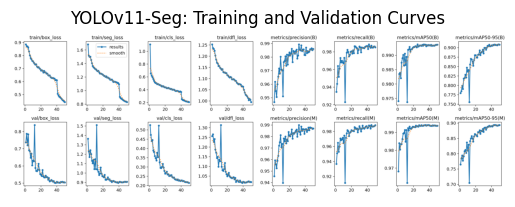

YOLOv11-Seg Performance Metrics:
mAP@0.5: 0.9937
mAP@0.5:0.95: 0.9091
IoU: 0.8932


In [19]:
# === Step 6: Evaluate YOLOv11-Seg ===
from ultralytics import YOLO
import pandas as pd
import matplotlib.pyplot as plt

# Load the trained YOLOv11 model
model11 = YOLO("/kaggle/working/yolov11_runs/yolov11_seg_train/weights/best.pt")

# Evaluate performance on validation set
metrics11 = model11.val(data="/kaggle/working/dataset.yaml")

# Plot training curves
img_path = "/kaggle/working/yolov11_runs/yolov11_seg_train/results.png"
plt.imshow(plt.imread(img_path))
plt.axis("off")
plt.title("YOLOv11-Seg: Training and Validation Curves")
plt.show()

# Show key metrics
print("YOLOv11-Seg Performance Metrics:")
print(f"mAP@0.5: {metrics11.box.map50:.4f}")
print(f"mAP@0.5:0.95: {metrics11.box.map:.4f}")
print(f"IoU: {metrics11.seg.map:.4f}")


## YOLOv11 Segmentation — Predicted vs Ground Truth Visualization

### Objective
To qualitatively evaluate the performance of the YOLOv11 segmentation model, a **visual comparison** is performed between predicted masks and ground truth annotations for a random subset of test images. This helps assess the model's segmentation accuracy and detect potential errors.

### Method
1. **Sample Selection:**  
   - Random images are selected from the test set (`test/images`).  
   - Corresponding YOLO label files are loaded from `test/labels`.

2. **Ground Truth Visualization:**  
   - Ground truth polygons are drawn using normalized YOLO coordinates, converted to pixel coordinates.  
   - Filled polygons are colored **green** with class labels for reference.

3. **Predicted Mask Visualization:**  
   - YOLOv11 predictions are obtained using the trained model with a confidence threshold of 0.25.  
   - Predicted masks are drawn in **red**, with outlines and class labels displayed on top.

4. **Side-by-Side Display:**  
   - For each image, the **ground truth** and **predicted masks** are displayed next to each other using `matplotlib`.  
   - This visual inspection highlights areas of agreement, missed detections, or false positives.

### Interpretation
- **Green polygons:** Ground truth  
- **Red polygons:** Model predictions  
- High overlap indicates good segmentation performance.  
- Discrepancies reveal areas for potential improvement, such as edge refinement or small object detection.

This qualitative evaluation complements quantitative metrics (mAP and IoU) to provide a **holistic assessment** of the YOLOv11 segmentation model.



0: 480x640 1 affected, 15.7ms
1: 480x640 1 affected, 15.7ms
2: 480x640 1 affected, 15.7ms
3: 480x640 1 affected, 15.7ms
Speed: 3.5ms preprocess, 15.7ms inference, 4.1ms postprocess per image at shape (1, 3, 480, 640)


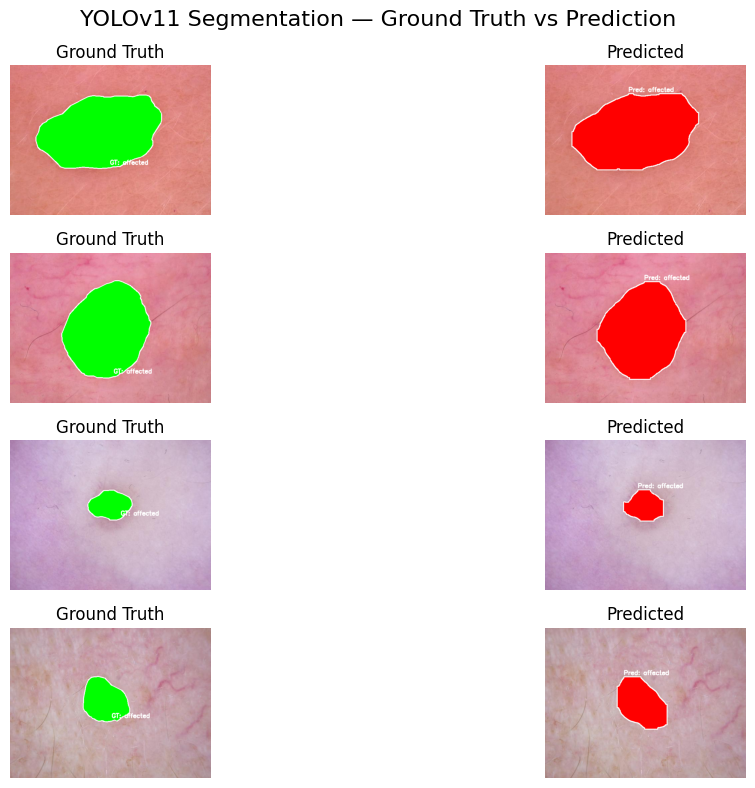

In [20]:
# ============================================================
# YOLOv11 Segmentation — Predicted vs Ground Truth Comparison
# ============================================================

import os, glob, random, cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Sample Selection ---
test_dir = cfg.get("test")
label_dir = test_dir.replace("/images", "/labels")  # assumes standard YOLO structure

sample_imgs = []
if test_dir and os.path.isdir(test_dir):
    all_imgs = [p for p in glob.glob(os.path.join(test_dir, "*.*"))
                if p.lower().endswith((".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff"))]
    sample_imgs = random.sample(all_imgs, min(4, len(all_imgs)))

# ------------------------------------------------------------
# 2. Helper: Draw Ground Truth Polygons
# ------------------------------------------------------------
def draw_gt_polygons(img_path, label_path, class_names=["affected","non"]):
    img = cv2.imread(img_path)
    h, w = img.shape[:2]
    overlay = img.copy()

    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            for line in f:
                vals = list(map(float, line.strip().split()))
                cls_id = int(vals[0])
                coords = vals[1:]
                if len(coords) > 4:
                    pts = np.array(coords).reshape(-1, 2)
                    pts[:, 0] *= w
                    pts[:, 1] *= h
                    pts = pts.astype(np.int32)
                    color = (0, 255, 0)  # green for GT
                    cv2.fillPoly(overlay, [pts], color)
                    cv2.polylines(overlay, [pts], True, (255, 255, 255), 2)
                    label = class_names[cls_id] if cls_id < len(class_names) else str(cls_id)
                    cv2.putText(overlay, f"GT: {label}", (pts[0][0], pts[0][1] - 10),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,255), 2)
    else:
        print(f"⚠️ No label file found for {os.path.basename(img_path)}")

    return overlay

# ------------------------------------------------------------
# 3. Helper: Draw Predicted Polygons
# ------------------------------------------------------------
def draw_pred_polygons(result):
    img = result.orig_img.copy()

    if getattr(result, "masks", None) is not None and result.masks is not None:
        for i, seg in enumerate(result.masks.xy):
            poly = np.array(seg, dtype=np.int32)
            color = (0, 0, 255)  # red for predictions
            cv2.fillPoly(img, [poly], color)
            cv2.polylines(img, [poly], True, (255, 255, 255), 2)
            if getattr(result, "names", None) is not None and getattr(result.boxes, "cls", None) is not None:
                cls_id = int(result.boxes.cls[i].item())
                label = result.names.get(cls_id, str(cls_id)) if isinstance(result.names, dict) else str(cls_id)
                x, y = poly[0]
                cv2.putText(img, f"Pred: {label}", (int(x), int(y) - 6),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,255), 2)
    else:
        print("⚠️ No predicted masks found for:", result.path)

    return img

# ------------------------------------------------------------
# 4. Run Inference on Test Images
# ------------------------------------------------------------
preds = model.predict(source=sample_imgs, imgsz=640, conf=0.25, device=0, save=False)

# ------------------------------------------------------------
# 5. Plot Predicted vs Ground Truth
# ------------------------------------------------------------
plt.figure(figsize=(14, 8))
for i, result in enumerate(preds):
    img_path = result.path
    label_path = os.path.join(label_dir, os.path.basename(img_path).replace(".jpg", ".txt").replace(".png", ".txt"))
    
    # Prepare visualizations
    vis_pred = draw_pred_polygons(result)
    vis_gt = draw_gt_polygons(img_path, label_path)

    vis_pred_rgb = cv2.cvtColor(vis_pred, cv2.COLOR_BGR2RGB)
    vis_gt_rgb = cv2.cvtColor(vis_gt, cv2.COLOR_BGR2RGB)

    # Display side by side
    plt.subplot(len(preds), 2, 2*i + 1)
    plt.imshow(vis_gt_rgb)
    plt.title("Ground Truth")
    plt.axis("off")

    plt.subplot(len(preds), 2, 2*i + 2)
    plt.imshow(vis_pred_rgb)
    plt.title("Predicted")
    plt.axis("off")

plt.suptitle("YOLOv11 Segmentation — Ground Truth vs Prediction", fontsize=16)
plt.tight_layout()
plt.show()
